# **Lab 5.2 Denoise & Deblur image with Autoencoder**

In [5]:
%pip install --upgrade pip
%pip install pytorch
%pip install torchvision
%pip install opencv-python
%pip install matplotlib
%pip install scikit-image
%pip install numpy

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
  Using cached pytorch-1.0.2.tar.gz (689 bytes)
  Preparing metadata (setup.py) ... done
  DEPRECATION: Building 'pytorch' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'pytorch'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [6 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
   

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm


## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.
The gaussian blur kernel size parameter should be random in the range [3,11]
and gaussian noise mean should be randoom in range [-50,50].

Parameters:
- image_paths: A list of paths to the images to be loaded.
- gauss_noise: A boolean flag to indicate if Gaussian noise should be added to the image.
- gauss_blur: A boolean flag to indicate if Gaussian blur should be applied to the image.
- resize: The size to which the image should be resized.
- p: Probability of applying certain transformations (like Gaussian noise or blur).

In [7]:
class CustomImageDataset(Dataset):
    def __init__(self, image_paths, gauss_noise=False, gauss_blur=None, resize=128, p=0.5):
        self.p = p
        self.resize = resize
        self.gauss_noise = gauss_noise
        self.gauss_blur = gauss_blur
        
        # Check if image_paths is a directory or a list of paths
        if isinstance(image_paths, str) and os.path.isdir(image_paths):
            # It's a directory path - collect all image files
            self.image_paths = []
            for file_name in os.listdir(image_paths):
                if file_name.lower().endswith((".png", ".jpg", ".jpeg")):
                    self.image_paths.append(os.path.join(image_paths, file_name))
            print(f"Found {len(self.image_paths)} images in {image_paths}")
        else:
            # It's already a list of image paths
            self.image_paths = image_paths
            print(f"Using provided list of {len(self.image_paths)} image paths")

    def __len__(self):
        return len(self.image_paths)
    
    def add_gaussian_noise(self, image, mean=0, var=0.01):
        # Add Gaussian noise first
        gaussian_noise = random_noise(image.numpy(), mode="gaussian", var=var, mean=mean)
        gaussian_noise = torch.tensor(gaussian_noise).float()
        
        # Add real salt and pepper noise
        gaussian_noise = self.add_salt_pepper_noise(gaussian_noise, salt_prob=0.01, pepper_prob=0.01)
        
        return gaussian_noise
    
    def add_salt_pepper_noise(self, image, salt_prob=0.5, pepper_prob=0.5):
        noisy_image = image.clone()
        
        # Generate random mask for salt noise (white pixels)
        salt_mask = torch.rand_like(image[0]) < salt_prob  # Use only one channel for mask
        noisy_image[:, salt_mask] = 1.0  # Set all RGB channels to white
        
        # Generate random mask for pepper noise (black pixels)
        pepper_mask = torch.rand_like(image[0]) < pepper_prob  # Use only one channel for mask
        noisy_image[:, pepper_mask] = 0.0  # Set all RGB channels to black
        
        return noisy_image

    def add_gaussian_blur(self, image, kernel_size):
        blur_transform = transforms.GaussianBlur(
            kernel_size=kernel_size, sigma=(0.1, 2.0)
        )
        return blur_transform(image)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        
        # Load image using OpenCV
        gt_image = cv2.imread(image_path)
        
        # Check if image loaded successfully
        if gt_image is None:
            raise FileNotFoundError(f"Could not load image from: {image_path}")
        
        # Convert BGR to RGB
        gt_image = cv2.cvtColor(gt_image, cv2.COLOR_BGR2RGB)
        
        # Resize to target size
        gt_image = cv2.resize(gt_image, (self.resize, self.resize))
        
        # Convert to tensor and normalize to [0, 1] - this will be our clean ground truth
        gt_image_tensor = torch.from_numpy(gt_image).permute(2, 0, 1).float() / 255.0
        
        # Create noisy version by copying the ground truth
        noisy_image = gt_image_tensor.clone()
        
        # Apply Gaussian blur with probability p
        if self.gauss_blur is True:
            if random.random() < self.p:
                noisy_image = self.add_gaussian_blur(noisy_image, kernel_size=random.choice([3, 5, 7, 9, 11]))
        
        # Apply Gaussian noise with probability p
        if self.gauss_noise is True:
            if random.random() < self.p:
                # Scale mean to [0, 1] range since image is normalized
                noise_mean = random.uniform(-50, 50) / 255.0
                noisy_image = self.add_gaussian_noise(noisy_image, mean=noise_mean, var=0.01)
        
        return noisy_image, gt_image_tensor

Use your [`CustomImageDataset()`](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#:~:text=transformed_dataset%20%3D%20FaceLandmarksDataset,3%3A%0A%20%20%20%20%20%20%20%20break)  to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Noisy blury images (this reference use salt and pepper noise)<br>
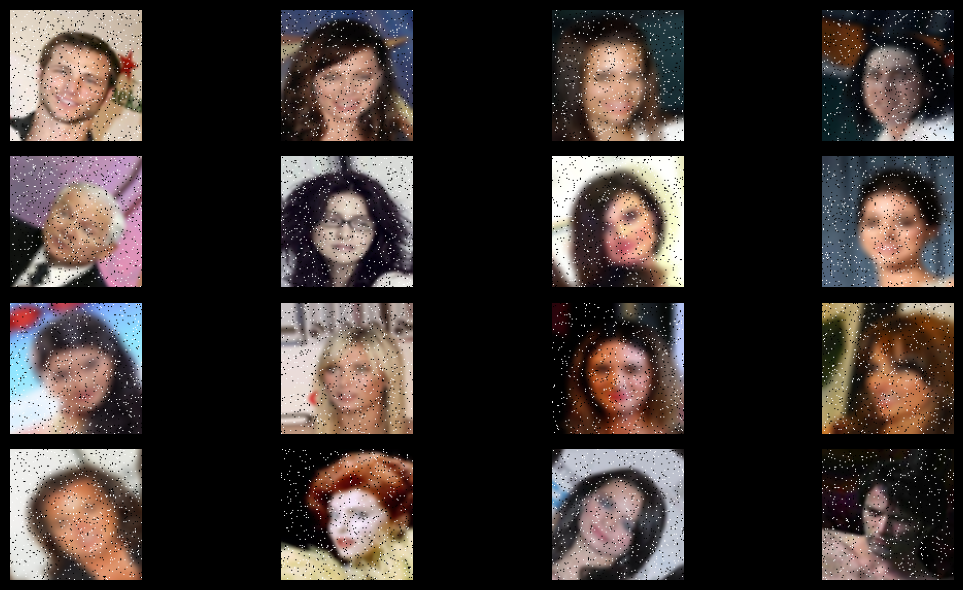

- Ground Truth images<br>
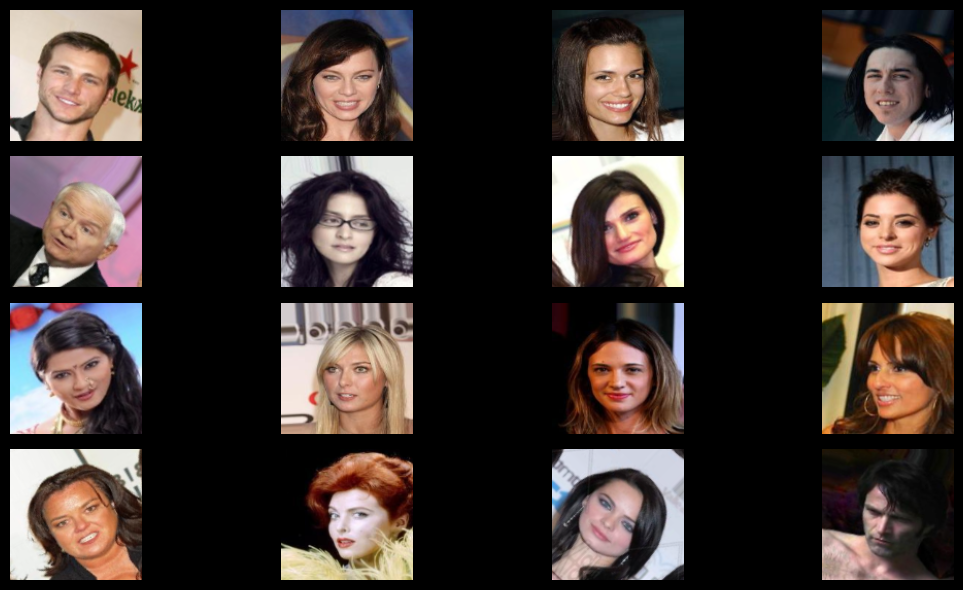

</details>

Complete the function below

In [8]:
### START CODE HERE ###
def imshow_grid(images):
    images = images[:16] 
    fig, axs = plt.subplots(4, 4, figsize=(6, 6))
    axs = axs.flatten()
    for img, ax in zip(images, axs):
        ax.imshow(img.permute(1, 2, 0).numpy())
        ax.axis('off')
    plt.tight_layout()
    plt.show()
### END CODE HERE ###

In [9]:
data_dir = "/Users/bellian/Img-Processing-Kitton/Lab5_CNN/data/img_align_celeba"  # Use absolute path
dataset = CustomImageDataset(data_dir, gauss_noise=True, gauss_blur=True, resize=128, p=0.5)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)  # Set proper batch_size, not None

print(f"Dataset created with {len(dataset)} images")

Found 30000 images in /Users/bellian/Img-Processing-Kitton/Lab5_CNN/data/img_align_celeba
Dataset created with 30000 images


In [10]:
print("Dataset length:", len(dataset))
print("First few image paths:")
for i in range(min(3, len(dataset.image_paths))):
    print(f"Index {i}: {dataset.image_paths[i]}")
    print(f"File exists: {os.path.exists(dataset.image_paths[i])}")


Dataset length: 30000
First few image paths:
Index 0: /Users/bellian/Img-Processing-Kitton/Lab5_CNN/data/img_align_celeba/003301.jpg
File exists: True
Index 1: /Users/bellian/Img-Processing-Kitton/Lab5_CNN/data/img_align_celeba/013112.jpg
File exists: True
Index 2: /Users/bellian/Img-Processing-Kitton/Lab5_CNN/data/img_align_celeba/005770.jpg
File exists: True


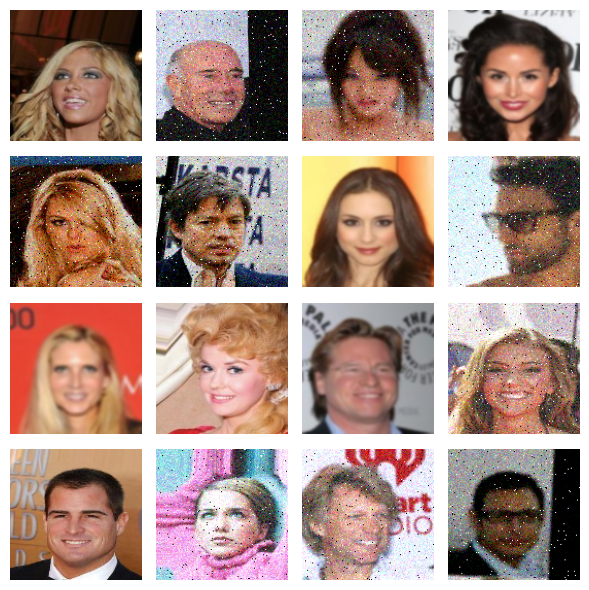

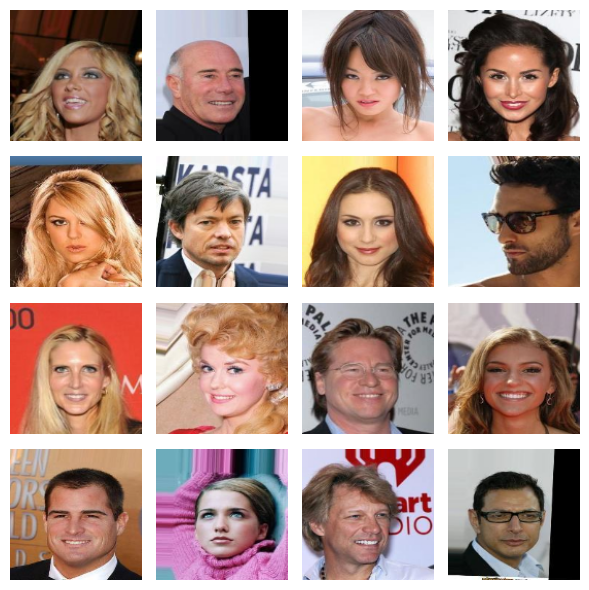

In [11]:
### START CODE HERE ###
batch,gt_img = next(iter(dataloader)) 
imshow_grid(batch)
imshow_grid(gt_img)
### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model based on the provided code below. However, please maintain the concept of 'Autoencoder'.
[Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)

In [12]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x

class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv_in = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.down1 = DownSamplingBlock(64, 128, kernel_size=3, stride=1, padding=1)
        self.down2 = DownSamplingBlock(128, 256, kernel_size=3, stride=1, padding=1)
        self.down3 = DownSamplingBlock(256, 512, kernel_size=3, stride=1, padding=1)
        self.down4 = DownSamplingBlock(512, 1024, kernel_size=3, stride=1, padding=1)
        self.up1 = UpSamplingBlock(1024, 512, kernel_size=3, stride=1, padding=1)
        self.up2 = UpSamplingBlock(512, 256, kernel_size=3, stride=1, padding=1)
        self.up3 = UpSamplingBlock(256, 128, kernel_size=3, stride=1, padding=1)
        self.up4 = UpSamplingBlock(128, 64, kernel_size=3, stride=1, padding=1)
        self.conv = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        x = self.conv_in(x)
        x = self.down1(x)
        x = self.down2(x)
        x = self.down3(x)
        x = self.down4(x)
        x = self.up1(x)
        x = self.up2(x)
        x = self.up3(x)
        x = self.up4(x)
        x = self.conv(x)
        return x
### END CODE HERE ###

If you define your model class correcly, the cell below should run without any errors.

In [13]:
model = Autoencoder()
print(model)
out = model(batch[0].unsqueeze(dim=0).float())

Autoencoder(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSamplingBlock(
    (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down3): DownSamplingBlock(
    (conv): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down4): DownSamplingBlock(
    (conv): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (up1): UpSamplingBlock(
   

## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [14]:
### START CODE HERE ###
def train(model, opt, loss_fn, train_loader, test_loader, epochs=10, checkpoint_path=None, device='cpu'):
    print("🤖Training on", device)
    model = model.to(device)
    
    train_losses = []
    test_losses = []
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_train_loss = 0.0
        train_bar = tqdm(train_loader, desc=f'🚀Training Epoch [{epoch+1}/{epochs}]', unit='batch')
        
        for images, gt in train_bar:
            # Move data to device
            images = images.to(device)
            gt = gt.to(device)
            
            # Zero gradients
            opt.zero_grad()
            
            # Forward pass
            reconstructed = model(images)
            
            # Calculate loss
            loss = loss_fn(reconstructed, gt)
            
            # Backward pass
            loss.backward()
            
            # Update weights
            opt.step()
            
            # Accumulate loss
            epoch_train_loss += loss.item()
            
            # Update progress bar
            train_bar.set_postfix({'Loss': f'{loss.item():.4f}'})
        
        # Calculate average training loss
        avg_train_loss = epoch_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Testing phase
        model.eval()
        epoch_test_loss = 0.0
        test_bar = tqdm(test_loader, desc='📄Testing', unit='batch')
        
        with torch.no_grad():
            for images, gt in test_bar:
                # Move data to device
                images = images.to(device)
                gt = gt.to(device)
                
                # Forward pass
                reconstructed = model(images)
                
                # Calculate loss
                loss = loss_fn(reconstructed, gt)
                
                # Accumulate loss
                epoch_test_loss += loss.item()
                
                # Update progress bar
                test_bar.set_postfix({'Loss': f'{loss.item():.4f}'})
        
        # Calculate average test loss
        avg_test_loss = epoch_test_loss / len(test_loader)
        test_losses.append(avg_test_loss)
        
        # Print epoch summary
        print(f'Epoch [{epoch+1}/{epochs}] - Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}')
        
        # Save checkpoint if path provided
        if checkpoint_path and (epoch + 1) % 5 == 0:  # Save every 5 epochs
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': opt.state_dict(),
                'train_loss': avg_train_loss,
                'test_loss': avg_test_loss,
            }, f'{checkpoint_path}_epoch_{epoch+1}.pth')
            print(f'Checkpoint saved at epoch {epoch+1}')
    
    return train_losses, test_losses
### END CODE HERE ###

Let's train your model.

In [15]:
### START CODE HERE ###

data_dir = "./data/img_align_celeba"

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Split the dataset into training and testing sets
train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)

print(f"Total files: {len(files)}")
print(f"Train files: {len(train_files)}")
print(f"Test files: {len(test_files)}")

train_dataset = CustomImageDataset(train_files, gauss_noise=True, gauss_blur=True, resize=128, p=0.5)
test_dataset = CustomImageDataset(test_files, gauss_noise=True, gauss_blur=True, resize=128, p=0.5)

trainloader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0)
testloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)

### END CODE HERE ###

Total files: 30000
Train files: 24000
Test files: 6000
Using provided list of 24000 image paths
Using provided list of 6000 image paths


In [ ]:
### START CODE HERE ###

model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()
train(model, opt, loss_fn, trainloader, testloader, epochs=10, checkpoint_path='autoencoder_checkpoint', device='cuda' if torch.cuda.is_available() else 'cpu')
### END CODE HERE ###

🤖Training on cpu


🚀Training Epoch [1/10]:   1%|          | 17/1500 [00:26<39:08,  1.58s/batch, Loss=0.1472]


KeyboardInterrupt: 

Let's use your trained model.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Input images<br>
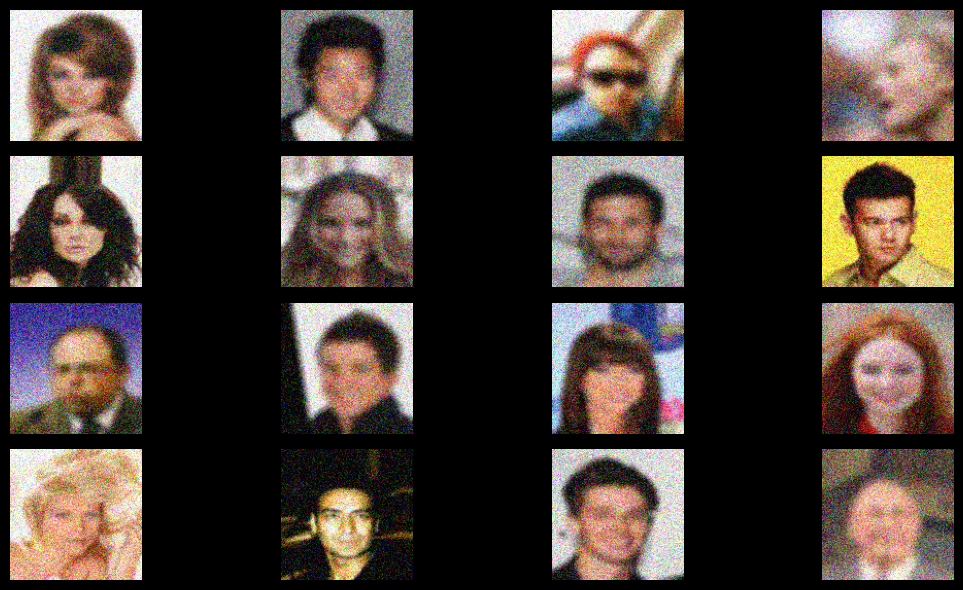

- Output images<br>
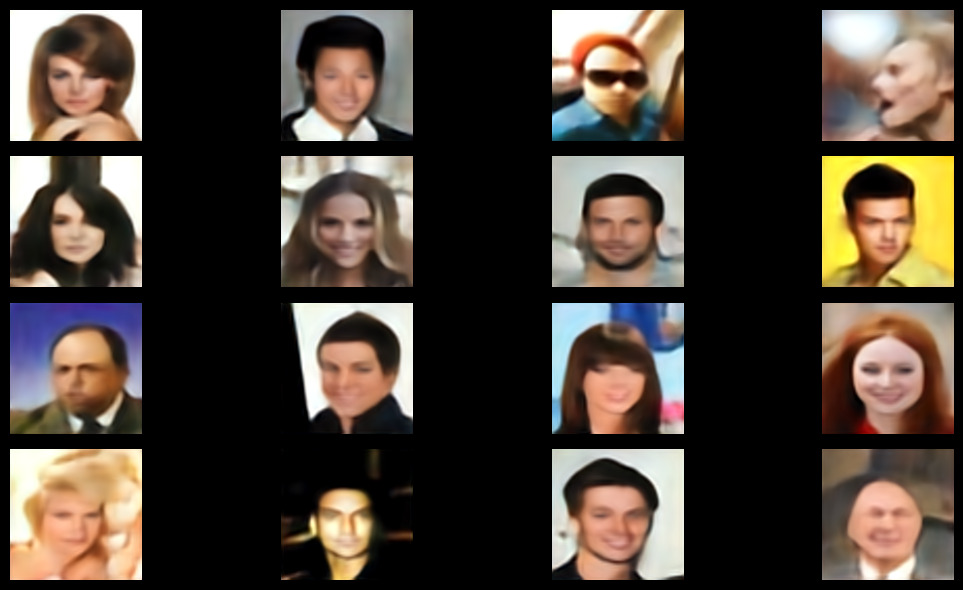

- Ground Truth images<br>
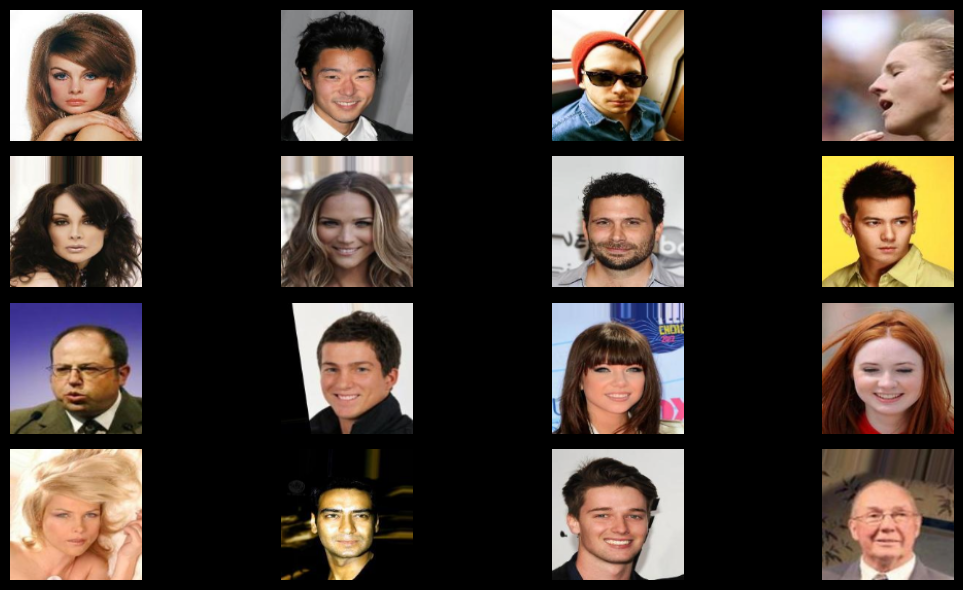

</details>

Noisy/Blurry Input Images:


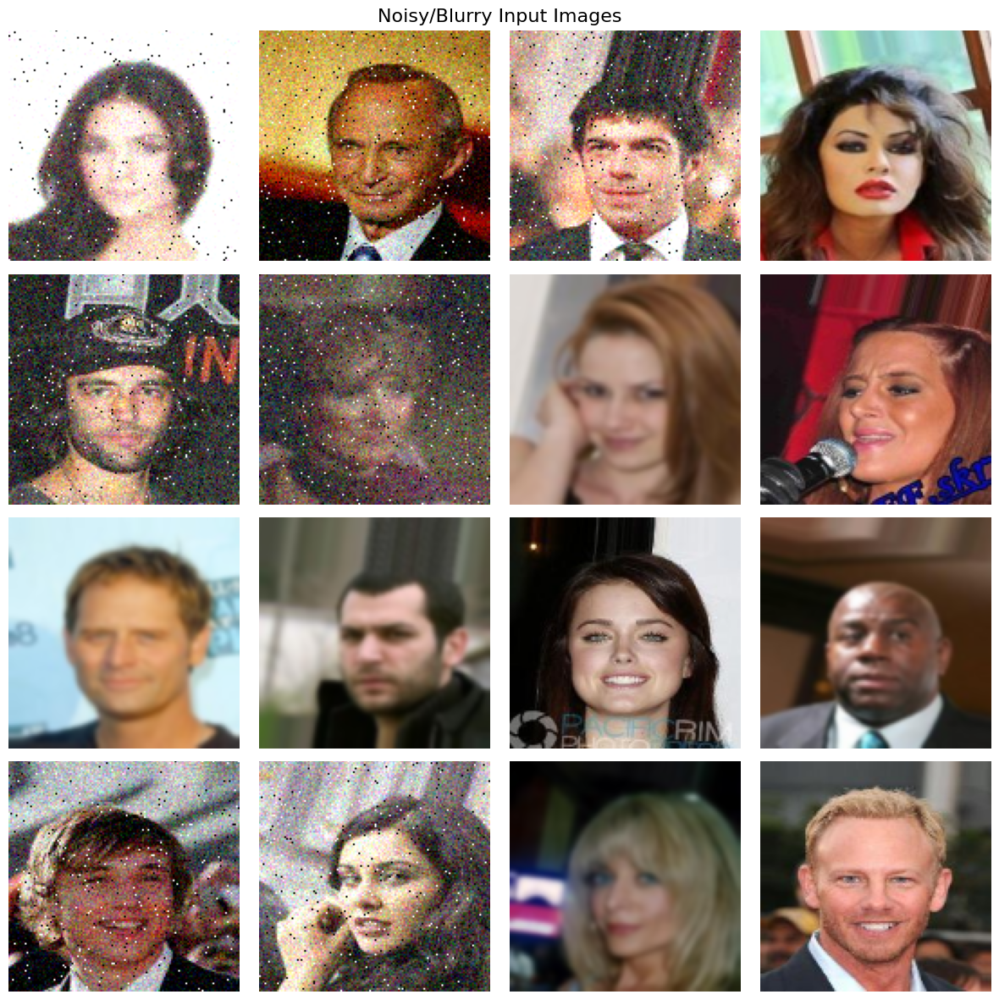

Reconstructed Images (Model Output):


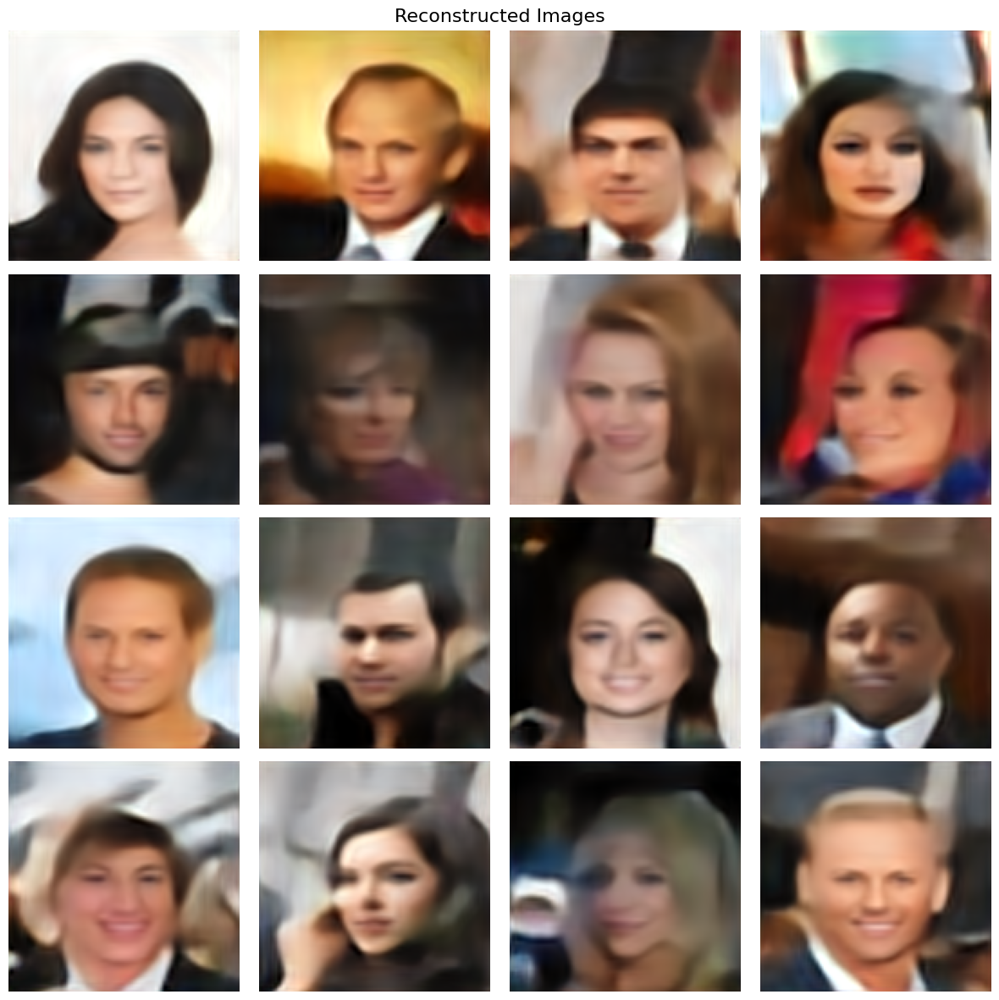

Ground Truth (Clean Images):


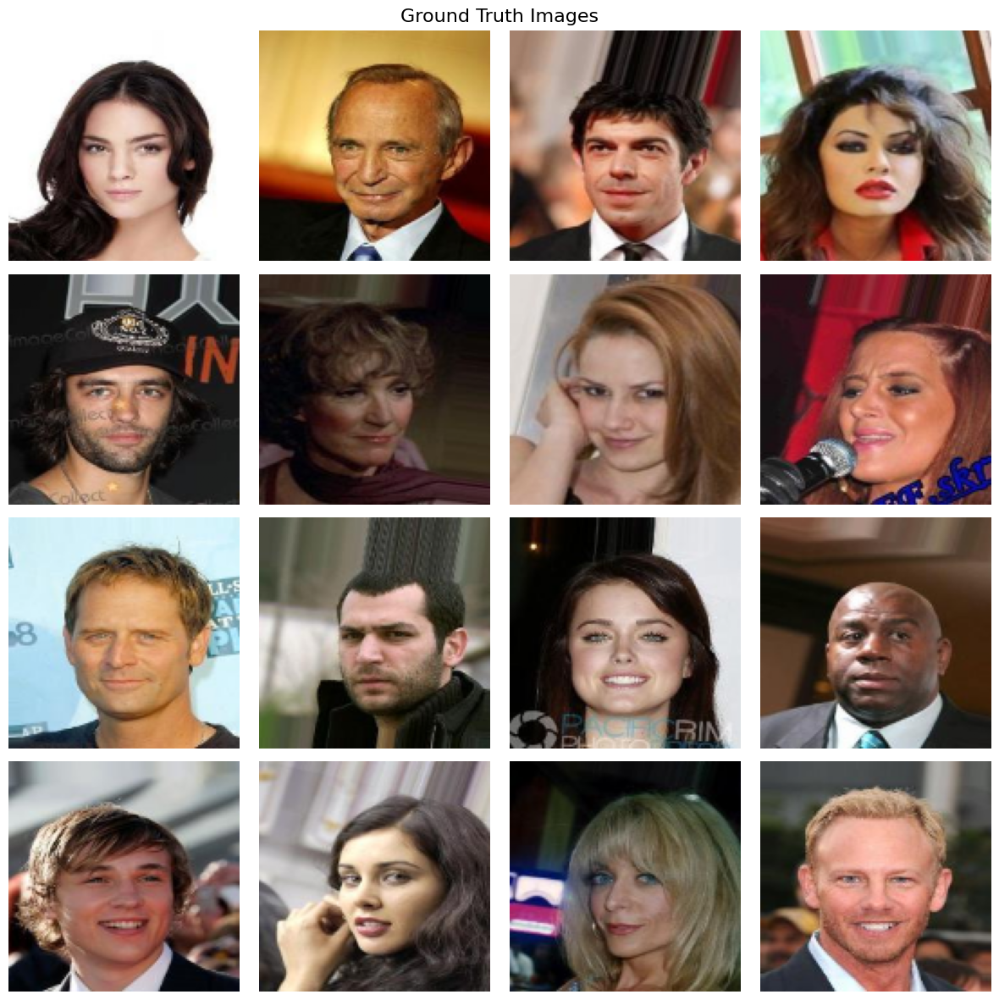

In [37]:
### START CODE HERE ###
import matplotlib.pyplot as plt

# Load the trained model from checkpoint
model = Autoencoder()  # Create a new instance of your model
checkpoint = torch.load('autoencoder_checkpoint_epoch_10.pth', map_location='cpu')
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

def show_results_4x4(model, dataloader, device="cpu", num_images=16):
    model.eval()
    images, gts = next(iter(dataloader))
    images, gts = images.to(device), gts.to(device)

    with torch.no_grad():
        outputs = model(images)

    images = images.cpu().numpy().transpose(0, 2, 3, 1)
    outputs = outputs.cpu().numpy().transpose(0, 2, 3, 1)
    gts = gts.cpu().numpy().transpose(0, 2, 3, 1)

    def plot_4x4(imgs, title=""):
        fig, axes = plt.subplots(4, 4, figsize=(12, 12))
        fig.suptitle(title, fontsize=16)
        for i in range(4):
            for j in range(4):
                idx = i * 4 + j
                if idx < len(imgs):
                    axes[i, j].imshow(imgs[idx].clip(0, 1))  # Remove the 0.5 + 0.5 since images are already in [0,1]
                    axes[i, j].axis("off")
        plt.tight_layout()
        plt.show()

    print("Noisy/Blurry Input Images:")
    plot_4x4(images, "Noisy/Blurry Input Images")
    
    print("Reconstructed Images (Model Output):")
    plot_4x4(outputs, "Reconstructed Images")
    
    print("Ground Truth (Clean Images):")
    plot_4x4(gts, "Ground Truth Images")

show_results_4x4(model, testloader, device="cpu", num_images=16)
### END CODE HERE ###

## Explore feature map
Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers or block of your model. Then, save it as an image.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

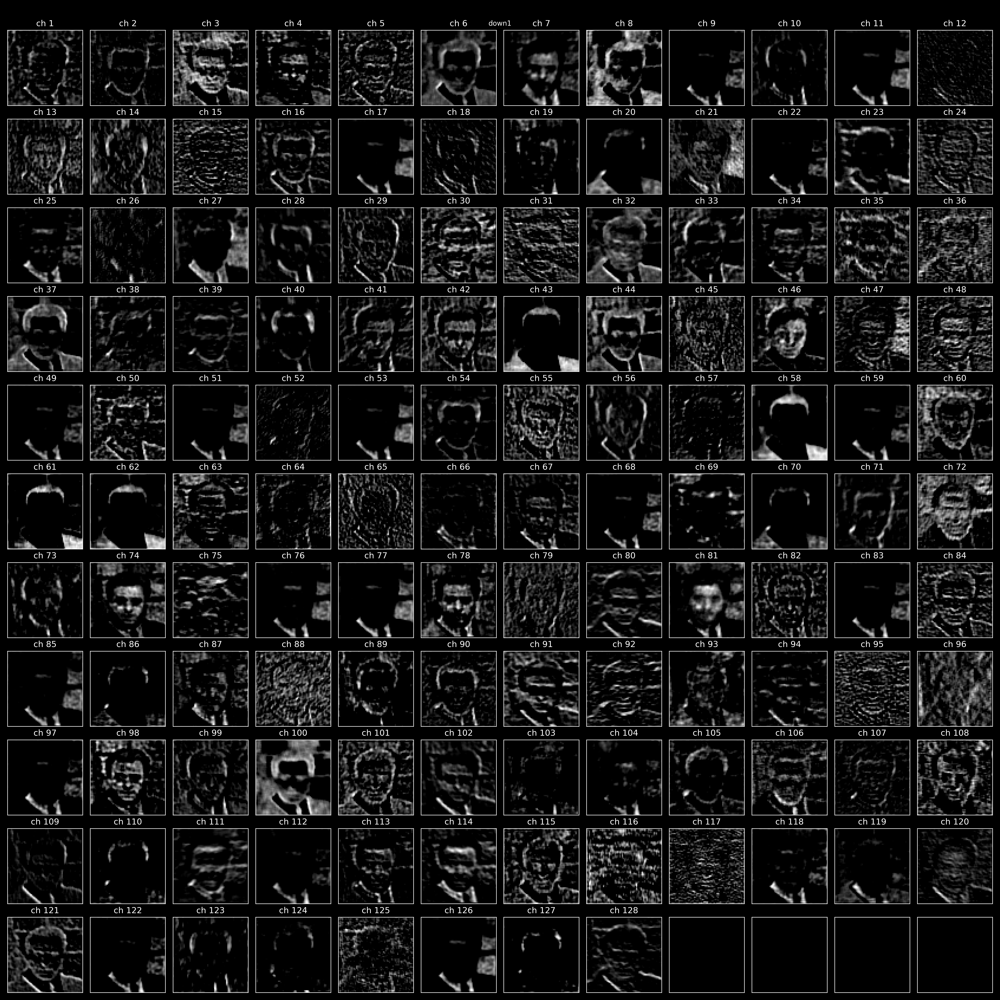
</details>

In [29]:
class FeatureExtractor(nn.Module):
    def __init__(self, model, target_layers):
        super(FeatureExtractor, self).__init__()
        self.model = copy.deepcopy(model)
        self.target_layers = target_layers
        self.features = []

        for layer_name, layer in self.model.named_modules():
            if layer_name in target_layers:
                layer.register_forward_hook(self.save_feature(layer_name))

    def save_feature(self, layer_name):
        def hook(module, input, output):
            self.features.append(output)
        return hook

    def forward(self, x):
        self.features = []
        self.model(x)
        return self.features

Input shape: torch.Size([1, 3, 128, 128])
Scanning model architecture...
  conv_in: Conv2d
  down1.conv: Conv2d
  down1.relu: ReLU
  down2.conv: Conv2d
  down2.relu: ReLU
  down3.conv: Conv2d
  down3.relu: ReLU
  down4.conv: Conv2d
  down4.relu: ReLU
  up1.conv: Conv2d
  up1.relu: ReLU
  up2.conv: Conv2d
  up2.relu: ReLU
  up3.conv: Conv2d
  up3.relu: ReLU
  up4.conv: Conv2d
  up4.relu: ReLU
  conv: Conv2d

Total layers to visualize: 18
Successfully extracted features from 18 layers

Processing conv_in (Conv2d): torch.Size([1, 64, 128, 128])
Processing down1.conv (Conv2d): torch.Size([1, 128, 128, 128])
Processing down1.relu (ReLU): torch.Size([1, 128, 128, 128])
Processing down2.conv (Conv2d): torch.Size([1, 256, 64, 64])
Processing down2.relu (ReLU): torch.Size([1, 256, 64, 64])
Processing down3.conv (Conv2d): torch.Size([1, 512, 32, 32])
Processing down3.relu (ReLU): torch.Size([1, 512, 32, 32])
Processing down4.conv (Conv2d): torch.Size([1, 1024, 16, 16])
Processing down4.relu (ReL

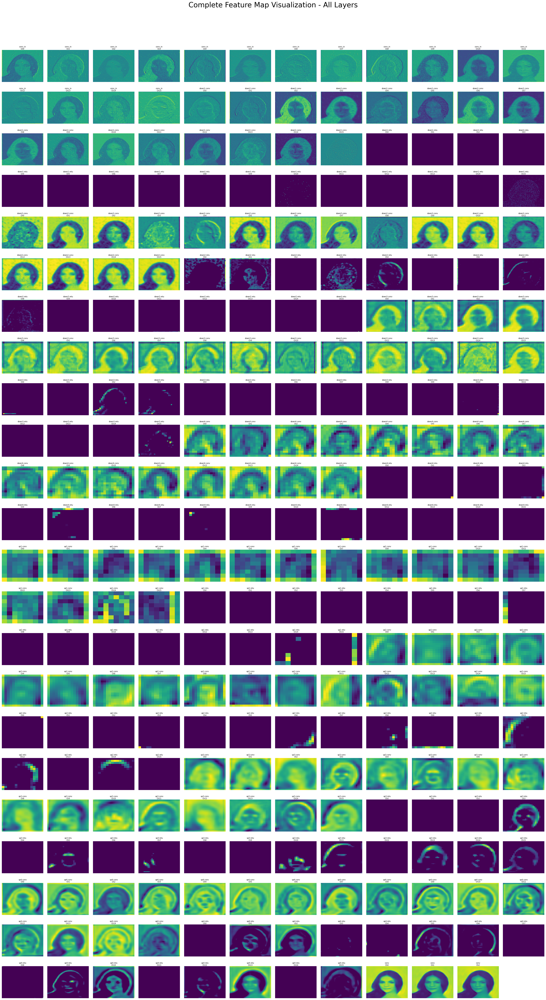


VISUALIZATION COMPLETE
Layers processed: 18
Feature maps displayed: 275
Grid size: 23 x 12
Saved as: autoencoder_features_all_layers_12col.png


In [42]:
### START CODE HERE ###
def visualize_feature_map(x, base_filename):
    # Get ALL layers that produce meaningful feature maps
    target_layers = []
    layer_info = []
    
    print("Scanning model architecture...")
    for name, module in model.named_modules():
        # Include Conv2d, ConvTranspose2d, Linear, and activation layers
        if isinstance(module, (nn.Conv2d, nn.ConvTranspose2d, nn.Linear, nn.ReLU, nn.Sigmoid, nn.Tanh)) and name != '':
            target_layers.append(name)
            layer_info.append((name, module.__class__.__name__))
            print(f"  {name}: {module.__class__.__name__}")
    
    print(f"\nTotal layers to visualize: {len(target_layers)}")
    print("="*60)
    
    # Create feature extractor
    feature_extractor = FeatureExtractor(model, target_layers)
    
    # Extract features from ALL layers
    with torch.no_grad():
        features = feature_extractor(x)
    
    print(f"Successfully extracted features from {len(features)} layers\n")
    
    # Prepare data for visualization
    all_feature_data = []
    total_subplots = 0
    
    for i, (feature, (layer_name, layer_type)) in enumerate(zip(features, layer_info)):
        print(f"Processing {layer_name} ({layer_type}): {feature.shape}")
        
        if len(feature.shape) == 4:  # Conv/ConvTranspose layers: [batch, channels, H, W]
            feature_map = feature[0]  # Take first batch
            # Show more channels for comprehensive visualization
            num_channels = min(16, feature_map.shape[0])  # Show up to 16 channels per layer
            
            for ch in range(num_channels):
                all_feature_data.append({
                    'data': feature_map[ch].cpu().numpy(),
                    'title': f'{layer_name}\nCh{ch}',
                    'type': '2d',
                    'layer_type': layer_type
                })
                total_subplots += 1
                
        elif len(feature.shape) == 2:  # Linear layers: [batch, features]
            feature_vec = feature[0].cpu().numpy()  # Take first batch
            all_feature_data.append({
                'data': feature_vec,
                'title': f'{layer_name}\n({len(feature_vec)} units)',
                'type': '1d',
                'layer_type': layer_type
            })
            total_subplots += 1
    
    print(f"\nTotal feature maps to display: {total_subplots}")
    
    # Create comprehensive grid layout with 12 columns
    cols = 12  # 12 columns as requested
    rows = (total_subplots + cols - 1) // cols
    
    # Create the mega-plot
    fig, axes = plt.subplots(rows, cols, figsize=(30, rows * 2.5))  # Wider figure for 12 columns
    fig.suptitle(f'Complete Feature Map Visualization - All Layers', fontsize=28, y=0.98)
    
    # Handle single row case
    if rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    # Plot all feature maps
    for idx, feature_data in enumerate(all_feature_data):
        if idx < len(axes):
            ax = axes[idx]
            data = feature_data['data']
            title = feature_data['title']
            plot_type = feature_data['type']
            
            if plot_type == '2d':
                # 2D feature maps (convolutional layers)
                im = ax.imshow(data, cmap='viridis', aspect='auto')
                ax.set_title(title, fontsize=7, pad=2)
                ax.axis('off')
                
            elif plot_type == '1d':
                # 1D feature vectors (linear layers)
                if len(data) <= 200:
                    ax.bar(range(len(data)), data, width=0.8, alpha=0.7)
                else:
                    # For large vectors, show sample
                    sample_indices = np.linspace(0, len(data)-1, 200, dtype=int)
                    ax.plot(sample_indices, data[sample_indices], linewidth=1, marker='o', markersize=1)
                
                ax.set_title(title, fontsize=7, pad=2)
                ax.tick_params(labelsize=5)
                ax.grid(True, alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(all_feature_data), len(axes)):
        axes[idx].axis('off')
    
    # Adjust layout for 12 columns
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.subplots_adjust(wspace=0.1, hspace=0.3)  # Adjust spacing for better visibility
    
    # Save with high DPI for clarity
    plt.savefig(f'{base_filename}_all_layers_12col.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print comprehensive summary
    print("\n" + "="*60)
    print("VISUALIZATION COMPLETE")
    print("="*60)
    print(f"Layers processed: {len(target_layers)}")
    print(f"Feature maps displayed: {len(all_feature_data)}")
    print(f"Grid size: {rows} x {cols}")
    print(f"Saved as: {base_filename}_all_layers_12col.png")

# Usage
sample_input, _ = next(iter(testloader))
sample_input = sample_input[:1]  # Take only first image

print("Input shape:", sample_input.shape)
print("="*60)

# Visualize ALL feature maps in 12-column layout
visualize_feature_map(sample_input, "autoencoder_features")
### END CODE HERE ###

In [ ]:
### START CODE HERE ###



### END CODE HERE ###

---

# Questions:
1. Explain how changing the number of layers and the number of nodes in a Convolutional Neural Network (CNN) affects its performance (model accuracy, training time, and generalization/overfitting?  
2. Explain a comparison of PSNR and SSIM values (objective measurment) to your eye perception (subjective measurement) and suggest the criteria for High, Medium, Low image quality.
3. Explain a comparison of the autoencoder results between training without/with augmentation by visualizing feature maps at each layer.
4. Ranking the autoencoder performance in terms of PSNR and SSIM for each augmentation technique. Which augmentation techiques are mostly affect the autoencoder performance and must introduce to the training?
5. If a flatten layer is added after the last downsampling block to create the latent code (1D) and a dense layer ((linear + activation node)+ reshape back to the feature map size of input of the first upsampling block ) is added at the first layer of decoder before the first upsampling block. Explain a comparison of autoencoder results between 2D vs 1D latent and how feature map of each decoder block changes?
6. Explain the effect of reduced latent code from 2D to 1D.

1.  Training Time   : If both of it increases, training time will increase too
    Model accuracy  : Number of nodes ↑ Learn noise,  Network Depth ↑ Learn more complex features
    Number of nodes ↑ and  Network Depth ↑ -> Overfit
2.  SSIM -> Similar to human eye
    SSIM : 0.95 → almost identical, 0.75 → noticeable differences, <0.5 → poor similarity.
    PSNR : 30 dB → decent quality, 40 dB → very high quality, <20 dB → poor quality
3.  Before upsampling, when an autoencoder is given augmented input, noise appears in the feature maps. However, after the upsampling layer, there is no noticeable difference.
4.  
| Rank | Augmentation Technique                                           | Effect on Autoencoder Performance | Notes                                                      |
| ---- | ---------------------------------------------------------------- | --------------------------------- | ---------------------------------------------------------- |
| 1    | Cutout / Random Erasing                                          | Very strong negative effect       | Occlusion disrupts reconstruction; PSNR/SSIM drop is large |
| 2    | Large Geometric Transformations (rotation, scaling, translation) | Strong negative effect            | Hard for autoencoder to reconstruct misaligned inputs      |
| 3    | Motion / Gaussian Blur                                           | Moderate negative effect          | Reduces sharpness; lowers PSNR, SSIM drops moderately      |
| 4    | Salt & Pepper Noise                                              | Moderate negative effect          | Random pixel corruption; lowers PSNR, minor SSIM effect    |
| 5    | Gaussian / Speckle Noise                                         | Mild negative effect              | Slight PSNR drop, SSIM mostly stable; improves robustness  |
| 6    | Brightness / Contrast / Color jitter                             | Minimal effect                    | PSNR slightly affected; SSIM remains stable                |
| 7    | Flipping / Small Crop / Small Rotation                           | Minimal effect                    | Metrics almost unchanged; adds spatial robustness          |

5.
- 2D latent: Each upsampling block receives a meaningful 2D map; activations reflect local patterns.
- 1D latent: First decoder block tries to “reassemble” local structure from dense output. Initial feature maps may be noisy or less coherent, but deeper layers gradually restore structure.

6. Reducing from 2D → 1D shifts the latent from a spatially structured representation to a globally compressed vector, which increases abstraction, may reduce detail fidelity, and requires more parameters in the first decoder layer.